# Gaussian Noise Simulation & Filtering in Digital Images

### DCIT 407 — Group 8

**Topics Covered:**
- Image noise theory & Gaussian noise simulation
- Gaussian filter — theory & implementation
- Median filter — theory & implementation
- Comparative analysis & real-world applications


# Section 1
## Image Noise Theory & Gaussian Noise


## 1.1 What is Image Noise?

- **Unwanted random variations** in pixel intensity values
- Degrades image quality — reduces clarity, distorts edges, obscures detail
- Introduced during **acquisition**, **transmission**, and **processing**
- Affects both human perception and automated analysis (segmentation, edge detection, etc.)


## 1.2 Sources of Image Noise

| Source | Description |
|--------|-------------|
| **Sensor limitations** | Random fluctuations from camera sensor imperfections |
| **Low-light conditions** | Higher amplification increases electronic noise |
| **Thermal noise** | Heat in electronic components affects signal accuracy |
| **Transmission errors** | Noise introduced during image transfer |
| **Quantization errors** | Approximation during analog-to-digital conversion |

> Noise is unavoidable in practical systems → **noise modeling** is essential


## 1.3 Common Noise Types

- **Salt-and-pepper noise** — random black & white pixels
- **Poisson noise** — photon counting in low-light imaging
- **Speckle noise** — radar and medical imaging
- **Gaussian noise** — follows a normal probability distribution ✅

> This project focuses on **Gaussian noise** — the most widely used noise model


## 1.4 Gaussian Noise

A type of **statistical noise** where intensity variations follow a **normal (Gaussian) distribution**.

![Normal Distribution](images/Normal_Distribution_06.png)

- Small noise values occur **more frequently** than large deviations
- Modeled as **additive noise**: added directly to the original signal


## Gaussian Noise — PDF

The probability density function:

$$p(z) = \frac{1}{\sqrt{2\pi\sigma^2}} \exp\left( -\frac{(z-\mu)^2}{2\sigma^2} \right)$$

| Symbol | Meaning |
|--------|---------|
| $\mu$ | Mean (average noise value) |
| $\sigma^2$ | Variance (noise strength) |
| $\sigma$ | Standard deviation |
| $z$ | Noise intensity value |


## 1.5 Key Characteristics

- **Additive:** $I_{noisy}(x, y) = I(x, y) + N(x, y)$
- **Random distribution** across all pixels
- **Statistically independent** pixel-to-pixel
- **Zero mean** (commonly assumed) — no systematic brightness shift
- **Variance-controlled** — $\sigma^2$ determines noise intensity

![Gaussian Noise Example](images/gaussian.webp)


![Gaussian Noise Example](images/gaussian.webp)

## 1.6 Why Study Gaussian Noise?

- Closely approximates noise in **real imaging systems**
- Strong **theoretical & statistical** foundation
- Classical denoising techniques are specifically designed for it
- Essential for evaluating **Gaussian filtering** and **Median filtering**


# Section 2
## Gaussian Noise Simulation


## 2.1 Introduction

**Gaussian noise** — statistical noise with a PDF equal to the normal distribution.

**Real-world applications:**
- Modeling noise in digital camera sensors
- Simulating transmission errors in communication systems
- Testing robustness of computer vision models

**Additive White Gaussian Noise (AWGN):**
- **Additive** — added to the original signal
- **White** — uniform power spectral density
- **Gaussian** — follows a normal distribution


## 2.3 Methodology — Steps

1. **Load image** from disk
2. **Convert to float** (avoid overflow during addition)
3. **Generate Gaussian noise** using `np.random.normal()`
4. **Add noise** to the original image matrix
5. **Clip values** to valid range $[0, 255]$
6. **Convert back** to `uint8`
7. **Display** original vs. noisy side-by-side


## 2.4 Implementation — Code

```python
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def add_gaussian_noise(image, mean=0, sigma=25):
    """
    Add Gaussian noise to an image.
    
    Args:
        image: Input image (numpy array)
        mean:  Mean of the Gaussian noise (default 0)
        sigma: Standard deviation of the noise (controls intensity)
    
    Returns:
        Noisy image as uint8
    """
    # Step 1: Convert to float32 to avoid overflow during addition
    img_float = image.astype(np.float32)
    
    # Step 2: Generate random Gaussian noise N(mean, sigma)
    # np.random.normal generates samples from normal distribution
    noise = np.random.normal(mean, sigma, image.shape)
    
    # Step 3: Add noise to the original image (additive noise model)
    noisy_image = img_float + noise
    
    # Step 4: Clip values to valid pixel range [0, 255]
    noisy_image = np.clip(noisy_image, 0, 255)
    
    # Step 5: Convert back to uint8 for display
    noisy_image = noisy_image.astype(np.uint8)
    
    return noisy_image

# Load the test image
image_path = 'images/original/lena.jpg'
original_img = cv2.imread(image_path)
original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Set noise parameters
MEAN = 0       # Zero-mean noise (no brightness shift)
SIGMA = 40     # Standard deviation (noise intensity)

# Apply Gaussian noise
noisy_img_rgb = add_gaussian_noise(original_img_rgb, MEAN, SIGMA)

# Display original vs noisy side-by-side
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(original_img_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(noisy_img_rgb)
plt.title(f'Noisy Image (Sigma={SIGMA})')
plt.axis('off')
plt.tight_layout()
plt.show()
```


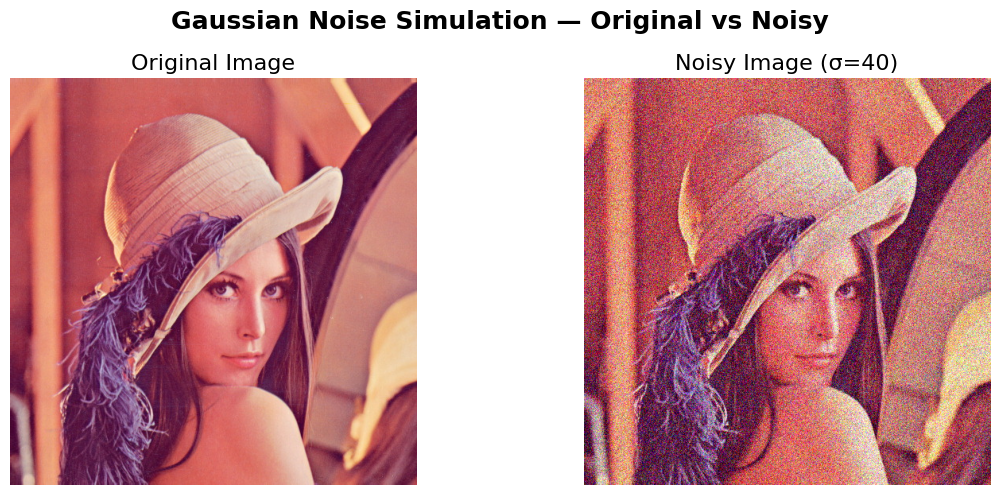

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def add_gaussian_noise(image, mean=0, sigma=25):
    img_float = image.astype(np.float32)
    noise = np.random.normal(mean, sigma, image.shape)
    noisy_image = img_float + noise
    noisy_image = np.clip(noisy_image, 0, 255)
    noisy_image = noisy_image.astype(np.uint8)
    return noisy_image

image_path = 'images/original/lena.jpg'
original_img = cv2.imread(image_path)
original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

MEAN = 0
SIGMA = 40

noisy_img_rgb = add_gaussian_noise(original_img_rgb, MEAN, SIGMA)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1); plt.imshow(original_img_rgb); plt.title('Original Image', fontsize=16); plt.axis('off')
plt.subplot(1, 2, 2); plt.imshow(noisy_img_rgb); plt.title(f'Noisy Image (σ={SIGMA})', fontsize=16); plt.axis('off')
plt.suptitle('Gaussian Noise Simulation — Original vs Noisy', fontsize=18, fontweight='bold')
plt.tight_layout(); plt.show()


![Gaussian Noise Example](gaussian-noise.png)

## 2.5 Results & Observations

| Observation | Detail |
|-------------|--------|
| **Grainy texture** | Pixel values fluctuate randomly — "snow" effect |
| **Color distortion** | Noise affects all R, G, B channels |
| **Low σ (5–10)** | Barely noticeable |
| **High σ (50+)** | Significantly obscures image details |

### Key Takeaway
> Increasing $\sigma$ directly correlates with severity of image degradation


![Gaussian Noise Example](images/gaussian.webp)

# Section 3
## Gaussian Filter — Theory & Implementation


## 3.1 What is a Gaussian Filter?

A **linear smoothing (low-pass) filter** using a kernel from the Gaussian distribution.

**Core Idea:**
- Higher weights to pixels **closer to center**
- Lower weights to pixels **farther away**
- Weight distribution follows the **bell-shaped curve**

**Key Distinction:**
| | Gaussian Filter | Median Filter |
|---|---|---|
| **Type** | Linear (weighted sum) | Non-linear (median) |
| **Output** | New values via convolution | Actual neighborhood values |


## 3.2 Mathematical Definition

### 2D Gaussian Function (Filter Kernel)

$$G(x, y) = \frac{1}{2\pi\sigma^2}\, e^{\displaystyle -\frac{x^2 + y^2}{2\sigma^2}}$$

### Convolution Operation

$$g(x, y) = \sum_{i=-k}^{k} \sum_{j=-k}^{k} G(i, j) \cdot f(x - i,\; y - j)$$

### Example: 3×3 Kernel ($\sigma \approx 0.85$)

$$G_{3\times3} = \frac{1}{16}\begin{bmatrix} 1 & 2 & 1 \\ 2 & 4 & 2 \\ 1 & 2 & 1 \end{bmatrix}$$


## 3.3 How the Gaussian Filter Works

1. **Choose parameters** — $\sigma$ and kernel size ($n = 2\lceil 3\sigma \rceil + 1$)
2. **Generate 2D Gaussian kernel** — compute $w(i,j) = e^{-(i^2 + j^2) / 2\sigma^2}$
3. **Normalize** — divide by sum so weights add to 1 (preserves brightness)
4. **Pad the image** — handle borders via reflection/replication
5. **Convolve** — for every pixel: place kernel → multiply → sum → assign
6. **Repeat** for all pixels


## 3.4 Visual Example — Denoising a Pixel

$$\text{Image Patch} = \begin{bmatrix} 100 & 120 & 95 \\ 110 & \mathbf{200} & 105 \\ 98 & 115 & 102 \end{bmatrix}$$

Center pixel = **200** (likely noisy)

After Gaussian filtering: **200 → 131**

> The noisy spike is **smoothed down** toward the neighborhood average, with nearby pixels contributing more than distant ones.


## 3.5 Key Properties

| Property | Advantage |
|----------|-----------|
| **Linearity** | Mathematically tractable; superposition applies |
| **Isotropy** | Uniform smoothing, no directional bias |
| **Separability** | $O(k^2) \to O(2k)$ per pixel — significant speedup |
| **Low-pass** | Removes high-frequency noise, preserves smooth regions |
| **Single parameter ($\sigma$)** | Simple to tune; larger $\sigma$ = more smoothing |
| **No ringing** | All positive weights → no overshoot near edges |
| **Brightness preservation** | Normalized kernel sums to 1 |


## 3.6 Important Mathematical Properties

- **Separability:** $G(x,y) = G(x) \cdot G(y)$ → two 1D passes instead of one 2D pass
- **Self-Fourier:** Wide spatial $\sigma$ → narrow frequency band → stronger smoothing
- **Cascading:** Two passes with $\sigma_1, \sigma_2$ = single pass with $\sigma = \sqrt{\sigma_1^2 + \sigma_2^2}$
- **Central Limit Theorem:** Repeated box filtering converges to Gaussian
- **Scale-Space:** Only kernel where no new features are created at coarser scales


## 3.7 Implementation — Kernel Generation

```python
class GaussianFilterImplementation:
    """
    Comprehensive Gaussian filter implementation class.
    Includes manual (from scratch), separable, and library-optimized versions,
    along with kernel generation and visualization utilities.
    """

    @staticmethod
    def generate_gaussian_kernel(size, sigma):
        """
        Generate a 2D Gaussian kernel from the mathematical definition.
        The kernel is built by evaluating the 2D Gaussian function
            G(x,y) = exp(-(x² + y²) / (2σ²))
        at every integer offset from the center, then normalizing so that
        all weights sum to 1 (brightness preservation).
        """
        if size % 2 == 0:
            raise ValueError("Kernel size must be odd")
        if sigma <= 0:
            raise ValueError("Sigma must be positive")

        # Half-width of the kernel
        k = size // 2

        # Create coordinate grids centered at 0
        # e.g. for size=5: ax = [-2, -1, 0, 1, 2]
        ax = np.arange(-k, k + 1, dtype=np.float64)
        xx, yy = np.meshgrid(ax, ax)

        # Evaluate the (unnormalized) 2D Gaussian
        kernel = np.exp(-(xx ** 2 + yy ** 2) / (2 * sigma ** 2))

        # Normalize so weights sum to 1
        kernel /= kernel.sum()

        return kernel
```


## 3.7 Implementation — Manual 2D Convolution

```python
    @staticmethod
    def gaussian_filter_manual(image, kernel_size=3, sigma=1.0):
        """
        Manual implementation of Gaussian filtering from scratch.
        Performs full 2D convolution using nested loops so that every
        step of the algorithm is transparent and inspectable.
        """
        # Step 1 – Build the Gaussian kernel
        kernel = GaussianFilterImplementation.generate_gaussian_kernel(
            kernel_size, sigma
        )

        height, width = image.shape
        pad = kernel_size // 2

        # Step 2 – Pad the image (reflect mode for better border handling)
        padded = np.pad(image.astype(np.float64), pad, mode='reflect')

        # Step 3 – Prepare output array
        filtered = np.zeros_like(image, dtype=np.float64)

        # Step 4 – Slide the kernel over every pixel
        for i in range(height):
            for j in range(width):
                # Extract the neighborhood window
                window = padded[i:i + kernel_size, j:j + kernel_size]

                # Element-wise multiply and sum (convolution at this pixel)
                filtered[i, j] = np.sum(window * kernel)

        return np.clip(filtered, 0, 255).astype(np.uint8)
```


## 3.7 Implementation — Separable Filter (Optimized)

```python
    @staticmethod
    def gaussian_filter_separable(image, kernel_size=3, sigma=1.0):
        """
        Separable Gaussian filter: two sequential 1D convolutions.
        Exploits the fact that G(x,y) = G(x)·G(y) so a 2D convolution
        can be decomposed into:
            1. Convolve each ROW with the 1D Gaussian   → intermediate
            2. Convolve each COLUMN of the intermediate  → final result
        Computational cost drops from O(k²) to O(2k) per pixel.
        """
        if kernel_size % 2 == 0:
            raise ValueError("Kernel size must be odd")

        # Build the 1D Gaussian kernel
        k = kernel_size // 2
        ax = np.arange(-k, k + 1, dtype=np.float64)
        kernel_1d = np.exp(-ax ** 2 / (2 * sigma ** 2))
        kernel_1d /= kernel_1d.sum()

        height, width = image.shape
        img = image.astype(np.float64)

        # --- Pass 1: convolve along rows (horizontal) ---
        pad_h = np.pad(img, ((0, 0), (k, k)), mode='reflect')
        intermediate = np.zeros_like(img)
        for i in range(height):
            for j in range(width):
                intermediate[i, j] = np.sum(
                    pad_h[i, j:j + kernel_size] * kernel_1d
                )

        # --- Pass 2: convolve along columns (vertical) ---
        pad_v = np.pad(intermediate, ((k, k), (0, 0)), mode='reflect')
        filtered = np.zeros_like(img)
        for i in range(height):
            for j in range(width):
                filtered[i, j] = np.sum(
                    pad_v[i:i + kernel_size, j] * kernel_1d
                )

        return np.clip(filtered, 0, 255).astype(np.uint8)

    # Library wrappers for optimized production use
    @staticmethod
    def gaussian_filter_opencv(image, kernel_size=3, sigma=1.0):
        return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

    @staticmethod
    def gaussian_filter_scipy(image, sigma=1.0):
        filtered = ndimage.gaussian_filter(image.astype(np.float64), sigma=sigma)
        return np.clip(filtered, 0, 255).astype(np.uint8)
```


## 3.7 Kernel Visualization — Code

```python
    @staticmethod
    def visualize_kernel(kernel_size=5, sigma=1.0):
        """Visualize the Gaussian kernel as 3D surface, 2D heatmap,
        and 1D cross-section to illustrate the bell-curve shape."""
        kernel = GaussianFilterImplementation.generate_gaussian_kernel(
            kernel_size, sigma
        )
        k = kernel_size // 2
        ax = np.arange(-k, k + 1)
        xx, yy = np.meshgrid(ax, ax)

        fig = plt.figure(figsize=(14, 4))

        # Subplot 1: 3D Surface Plot
        ax1 = fig.add_subplot(131, projection='3d')
        ax1.plot_surface(xx, yy, kernel, cmap='viridis',
                         edgecolor='k', linewidth=0.3)
        ax1.set_title(f'3D Kernel ({kernel_size}×{kernel_size}, σ={sigma})')

        # Subplot 2: 2D Heatmap with kernel weight annotations
        ax2 = fig.add_subplot(132)
        im = ax2.imshow(kernel, cmap='YlOrRd', interpolation='nearest')
        for i in range(kernel_size):
            for j in range(kernel_size):
                ax2.text(j, i, f'{kernel[i,j]:.3f}',
                         ha='center', va='center', fontsize=8)
        ax2.set_title('2D Heatmap')
        plt.colorbar(im, ax=ax2, shrink=0.8)

        # Subplot 3: 1D Cross-Section through center row
        ax3 = fig.add_subplot(133)
        center = kernel_size // 2
        ax3.plot(ax, kernel[center, :], 'b-o', linewidth=2)
        ax3.fill_between(ax, kernel[center, :], alpha=0.3)
        ax3.set_title('1D Cross-Section')
        ax3.grid(True, alpha=0.3)

        plt.suptitle(f'Gaussian Kernel Visualization ({kernel_size}×{kernel_size}, σ={sigma})')
        plt.tight_layout()
        plt.show()
```


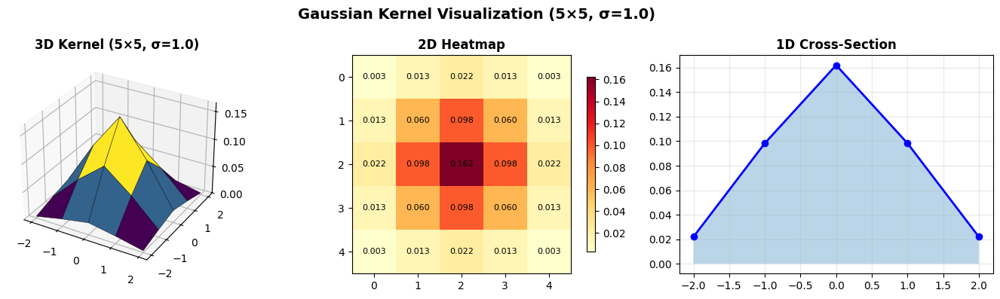

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def generate_gaussian_kernel(size, sigma):
    k = size // 2
    ax = np.arange(-k, k + 1, dtype=np.float64)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= kernel.sum()
    return kernel

kernel = generate_gaussian_kernel(5, 1.0)
k = 2; ax = np.arange(-k, k + 1); xx, yy = np.meshgrid(ax, ax)

fig = plt.figure(figsize=(14, 4))
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(xx, yy, kernel, cmap='viridis', edgecolor='k', linewidth=0.3)
ax1.set_title('3D Kernel (5×5, σ=1.0)', fontweight='bold')

ax2 = fig.add_subplot(132)
im = ax2.imshow(kernel, cmap='YlOrRd', interpolation='nearest')
for i in range(5):
    for j in range(5):
        ax2.text(j, i, f'{kernel[i,j]:.3f}', ha='center', va='center', fontsize=8)
ax2.set_title('2D Heatmap', fontweight='bold'); plt.colorbar(im, ax=ax2, shrink=0.8)

ax3 = fig.add_subplot(133)
ax3.plot(ax, kernel[2,:], 'b-o', linewidth=2); ax3.fill_between(ax, kernel[2,:], alpha=0.3)
ax3.set_title('1D Cross-Section', fontweight='bold'); ax3.grid(True, alpha=0.3)

plt.suptitle('Gaussian Kernel Visualization (5×5, σ=1.0)', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


![Gaussian Noise Example](GF-GraphsMatrix.png)

## 3.8 Filter Demonstration — Code

```python
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Load test image in grayscale
original = cv2.imread('images/original/lena.jpg', cv2.IMREAD_GRAYSCALE)

# Add Gaussian noise with σ=25
def add_gaussian_noise(image, mean=0, sigma=25):
    img_float = image.astype(np.float64)
    noise = np.random.normal(mean, sigma, image.shape)
    return np.clip(img_float + noise, 0, 255).astype(np.uint8)

noisy = add_gaussian_noise(original, sigma=25)

# Test multiple sigma values to show the effect of filter strength
sigma_values = [0.5, 1.0, 1.5, 2.0, 3.0]

fig, axes = plt.subplots(1, len(sigma_values) + 1, figsize=(22, 4))
axes[0].imshow(noisy, cmap='gray')
axes[0].set_title('Noisy (σ_noise=25)')
axes[0].axis('off')

for idx, sig in enumerate(sigma_values, 1):
    # Compute kernel size from sigma: k = 2*ceil(3σ) + 1
    ks = 2 * int(np.ceil(3 * sig)) + 1
    
    # Apply Gaussian filter using OpenCV
    filtered = cv2.GaussianBlur(noisy, (ks, ks), sig)
    
    # Compute quality metrics
    p = psnr(original, filtered, data_range=255)
    s = ssim(original, filtered, data_range=255)
    
    axes[idx].imshow(filtered, cmap='gray')
    axes[idx].set_title(f'σ={sig} ({ks}×{ks})\nPSNR={p:.1f} SSIM={s:.3f}')
    axes[idx].axis('off')

plt.suptitle('Effect of Gaussian Filter σ on Denoising')
plt.tight_layout()
plt.show()
```


## 3.9 Frequency Domain Analysis — Code

```python
# Compute 2D FFT magnitude spectra to visualize frequency domain
def fft_magnitude(image):
    """Compute centered log-magnitude spectrum."""
    f = np.fft.fft2(image.astype(np.float64))
    fshift = np.fft.fftshift(f)  # Shift zero frequency to center
    magnitude = np.log1p(np.abs(fshift))  # Log scale for visualization
    return magnitude

# Load images and add noise
original = cv2.imread('images/original/lena.jpg', cv2.IMREAD_GRAYSCALE)
noisy = add_gaussian_noise(original, sigma=25)
filtered = cv2.GaussianBlur(noisy, (7, 7), 1.5)

# Compute FFT magnitude spectra
mag_orig = fft_magnitude(original)
mag_noisy = fft_magnitude(noisy)
mag_filtered = fft_magnitude(filtered)

# Visualize spatial vs frequency domain
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Spatial domain (top row)
axes[0, 0].imshow(original, cmap='gray')
axes[0, 0].set_title('Original (Clean)')
axes[0, 1].imshow(noisy, cmap='gray')
axes[0, 1].set_title('Noisy (sigma=25)')
axes[0, 2].imshow(filtered, cmap='gray')
axes[0, 2].set_title('Gaussian Filtered (sigma=1.5)')

# Frequency domain (bottom row) - FFT magnitude spectra
axes[1, 0].imshow(mag_orig, cmap='inferno')
axes[1, 0].set_title('FFT -- Original')
axes[1, 1].imshow(mag_noisy, cmap='inferno')
axes[1, 1].set_title('FFT -- Noisy\n(noise adds high-freq energy)')
axes[1, 2].imshow(mag_filtered, cmap='inferno')
axes[1, 2].set_title('FFT -- Filtered\n(high-freq attenuated)')

plt.suptitle('Spatial vs Frequency Domain: Gaussian Filter as Low-Pass Filter')
plt.tight_layout()
plt.show()
```


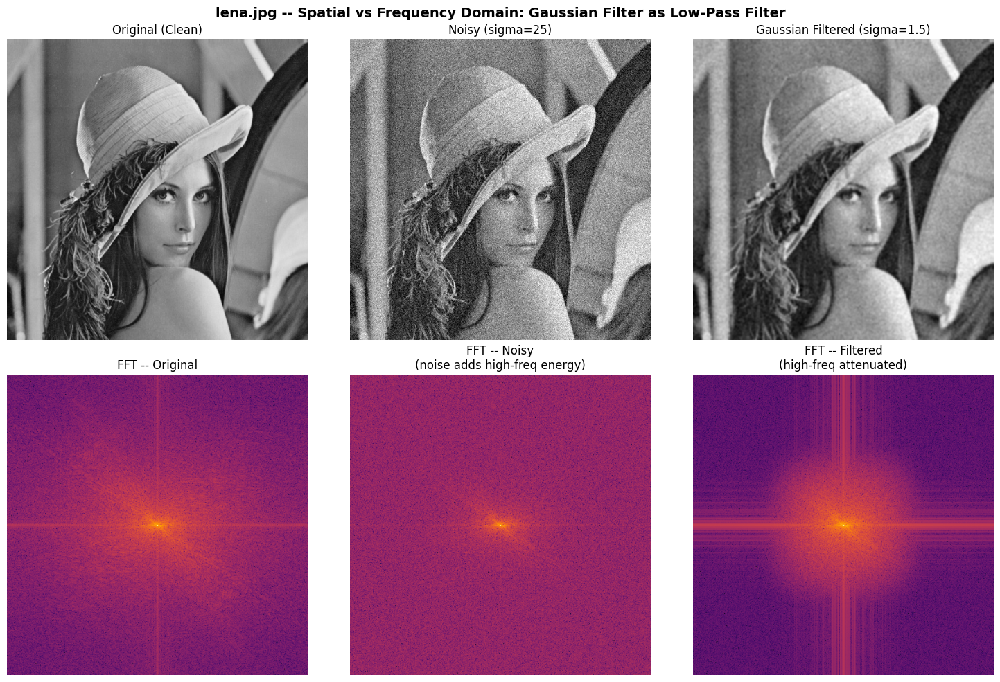

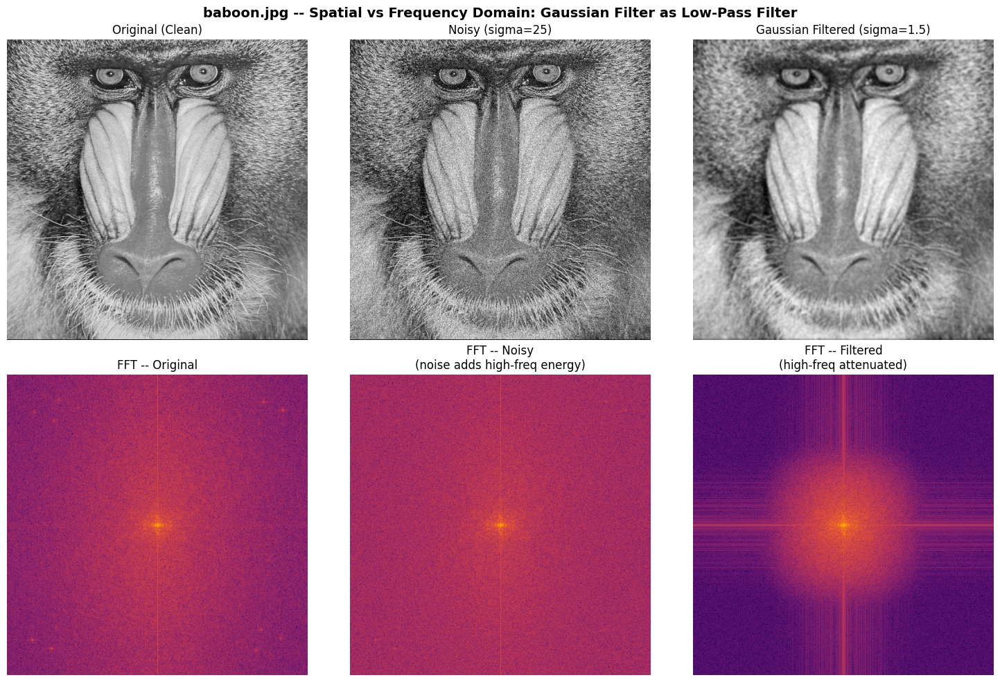

In [3]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt

_images_dir = os.path.join(os.getcwd(), 'images', 'original')

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

def fft_magnitude(image):
    f = np.fft.fft2(image.astype(np.float64))
    fshift = np.fft.fftshift(f)
    magnitude = np.log1p(np.abs(fshift))
    return magnitude

# Process both lena.jpg and baboon.jpg
for img_name in ['lena.jpg', 'baboon.jpg']:
    original = cv2.imread(os.path.join(_images_dir, img_name), cv2.IMREAD_GRAYSCALE)
    if original is None:
        continue
    noisy = add_gnoise(original, 25)
    filtered = cv2.GaussianBlur(noisy, (7, 7), 1.5)
    
    mag_orig = fft_magnitude(original)
    mag_noisy = fft_magnitude(noisy)
    mag_filtered = fft_magnitude(filtered)
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(original, cmap='gray'); axes[0, 0].set_title('Original (Clean)'); axes[0, 0].axis('off')
    axes[0, 1].imshow(noisy, cmap='gray'); axes[0, 1].set_title('Noisy (sigma=25)'); axes[0, 1].axis('off')
    axes[0, 2].imshow(filtered, cmap='gray'); axes[0, 2].set_title('Gaussian Filtered (sigma=1.5)'); axes[0, 2].axis('off')
    axes[1, 0].imshow(mag_orig, cmap='inferno'); axes[1, 0].set_title('FFT -- Original'); axes[1, 0].axis('off')
    axes[1, 1].imshow(mag_noisy, cmap='inferno'); axes[1, 1].set_title('FFT -- Noisy\n(noise adds high-freq energy)'); axes[1, 1].axis('off')
    axes[1, 2].imshow(mag_filtered, cmap='inferno'); axes[1, 2].set_title('FFT -- Filtered\n(high-freq attenuated)'); axes[1, 2].axis('off')
    plt.suptitle(f'{img_name} -- Spatial vs Frequency Domain: Gaussian Filter as Low-Pass Filter', fontsize=14, fontweight='bold')
    plt.tight_layout(); plt.show()


![Frequency](frequency-domain-lena.png)

![Frequency](frequency-domain-baboon.png)

## 3.10 Radial Frequency Profile — Code

```python
# Compute radially averaged frequency profile
def radial_profile(magnitude):
    """Compute radially averaged frequency profile from center."""
    center = np.array(magnitude.shape) // 2
    y, x = np.ogrid[:magnitude.shape[0], :magnitude.shape[1]]
    r = np.sqrt((x - center[1])**2 + (y - center[0])**2).astype(int)
    max_r = min(center)
    profile = np.zeros(max_r)
    count = np.zeros(max_r)
    mask = r < max_r
    np.add.at(profile, r[mask], magnitude[mask])
    np.add.at(count, r[mask], 1)
    count[count == 0] = 1
    return profile / count

# Compute profiles for original, noisy, and filtered
prof_orig = radial_profile(mag_orig)
prof_noisy = radial_profile(mag_noisy)
prof_filt = radial_profile(mag_filtered)

# Plot radial frequency profile
fig, ax = plt.subplots(figsize=(10, 5))
freqs = np.arange(len(prof_orig))
ax.plot(freqs, prof_orig, 'g-', linewidth=2, label='Original')
ax.plot(freqs, prof_noisy, 'r-', linewidth=1.5, label='Noisy (sigma=25)')
ax.plot(freqs, prof_filt, 'b-', linewidth=2, label='Gaussian Filtered (sigma=1.5)')
ax.fill_between(freqs, prof_noisy, prof_filt, alpha=0.15, color='red',
                label='Removed noise energy')
ax.set_xlabel('Spatial Frequency (pixels from center)')
ax.set_ylabel('Log Magnitude')
ax.set_title('Radial Frequency Profile: Gaussian Filter Attenuates High Frequencies')
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
```


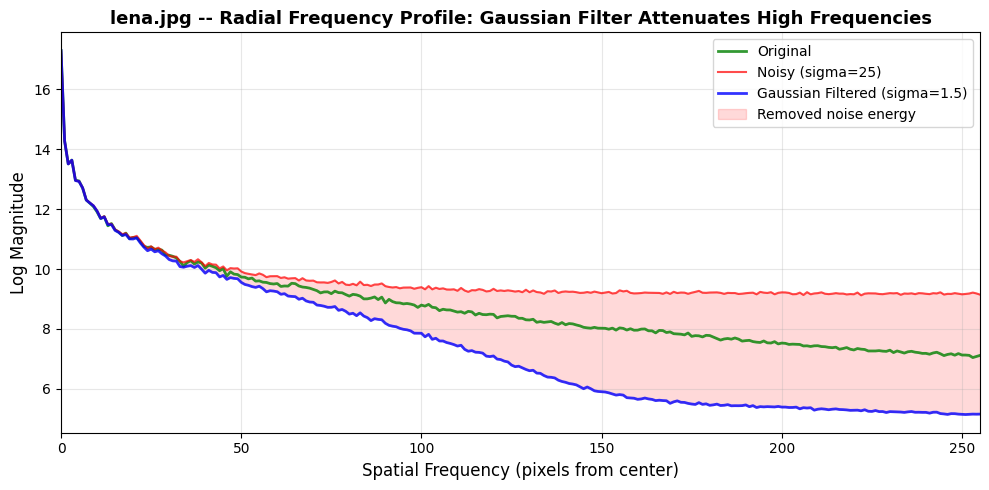

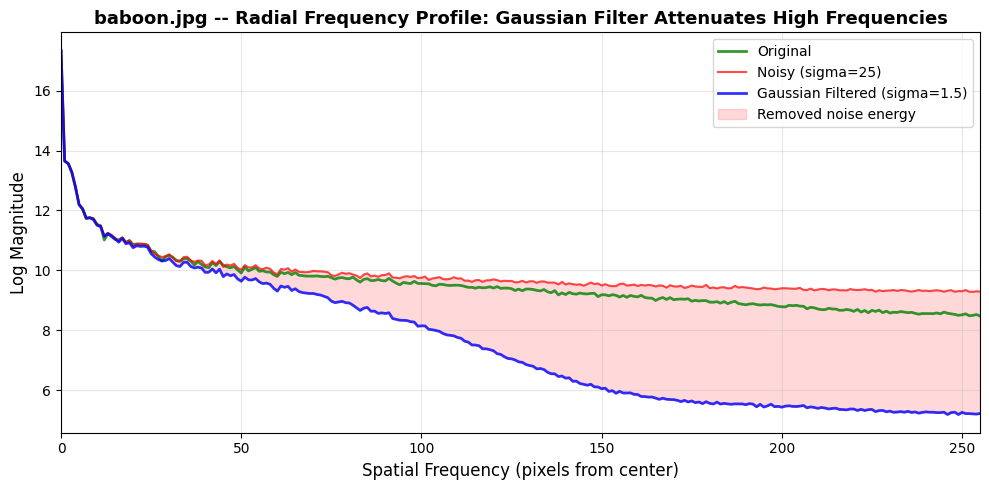

In [2]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt

_images_dir = os.path.join(os.getcwd(), 'images', 'original')

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

def fft_magnitude(image):
    f = np.fft.fft2(image.astype(np.float64))
    fshift = np.fft.fftshift(f)
    return np.log1p(np.abs(fshift))

def radial_profile(magnitude):
    center = np.array(magnitude.shape) // 2
    y, x = np.ogrid[:magnitude.shape[0], :magnitude.shape[1]]
    r = np.sqrt((x - center[1])**2 + (y - center[0])**2).astype(int)
    max_r = min(center)
    profile = np.zeros(max_r)
    count = np.zeros(max_r)
    mask = r < max_r
    np.add.at(profile, r[mask], magnitude[mask])
    np.add.at(count, r[mask], 1)
    count[count == 0] = 1
    return profile / count

for img_name in ['lena.jpg', 'baboon.jpg']:
    original = cv2.imread(os.path.join(_images_dir, img_name), cv2.IMREAD_GRAYSCALE)
    if original is None:
        continue
    noisy = add_gnoise(original, 25)
    filtered = cv2.GaussianBlur(noisy, (7, 7), 1.5)
    
    mag_orig = fft_magnitude(original)
    mag_noisy = fft_magnitude(noisy)
    mag_filtered = fft_magnitude(filtered)
    
    prof_orig = radial_profile(mag_orig)
    prof_noisy = radial_profile(mag_noisy)
    prof_filt = radial_profile(mag_filtered)
    
    fig, ax = plt.subplots(figsize=(10, 5))
    freqs = np.arange(len(prof_orig))
    ax.plot(freqs, prof_orig, 'g-', linewidth=2, label='Original', alpha=0.8)
    ax.plot(freqs, prof_noisy, 'r-', linewidth=1.5, label='Noisy (sigma=25)', alpha=0.7)
    ax.plot(freqs, prof_filt, 'b-', linewidth=2, label='Gaussian Filtered (sigma=1.5)', alpha=0.8)
    ax.fill_between(freqs, prof_noisy, prof_filt, alpha=0.15, color='red', label='Removed noise energy')
    ax.set_xlabel('Spatial Frequency (pixels from center)', fontsize=12)
    ax.set_ylabel('Log Magnitude', fontsize=12)
    ax.set_title(f'{img_name} -- Radial Frequency Profile: Gaussian Filter Attenuates High Frequencies', fontsize=13, fontweight='bold')
    ax.legend(fontsize=10); ax.grid(True, alpha=0.3); ax.set_xlim(0, len(freqs) - 1)
    plt.tight_layout(); plt.show()


## 3.11 Processing Time Comparison — Code

```python
import time

# Compare different Gaussian filter implementations
crop = original[:128, :128]  # Use smaller crop for speed testing
noisy_crop = add_gaussian_noise(crop, sigma=25)

ks_test, sig_test = 5, 1.0

# Manual 2D convolution
start = time.time()
filtered_manual = gaussian_filter_manual(noisy_crop, ks_test, sig_test)
t_manual = time.time() - start

# Separable implementation
start = time.time()
filtered_separable = gaussian_filter_separable(noisy_crop, ks_test, sig_test)
t_separable = time.time() - start

# OpenCV optimized
start = time.time()
filtered_opencv = cv2.GaussianBlur(noisy_crop, (ks_test, ks_test), sig_test)
t_opencv = time.time() - start

# SciPy optimized
from scipy import ndimage
start = time.time()
filtered_scipy = ndimage.gaussian_filter(noisy_crop.astype(np.float64), sigma=sig_test)
t_scipy = time.time() - start

times = {'Manual 2D': t_manual, 'Separable': t_separable,
         'OpenCV': t_opencv, 'SciPy': t_scipy}

# Bar chart
fig, ax = plt.subplots(figsize=(8, 4))
colors = ['#e74c3c', '#f39c12', '#2ecc71', '#3498db']
bars = ax.bar(times.keys(), times.values(), color=colors, edgecolor='black')
for bar, t in zip(bars, times.values()):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.001,
            f'{t:.4f}s', ha='center', fontweight='bold')
ax.set_ylabel('Time (seconds)')
ax.set_title(f'Processing Time Comparison ({crop.shape[0]}x{crop.shape[1]} image, {ks_test}x{ks_test} kernel)')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()
```


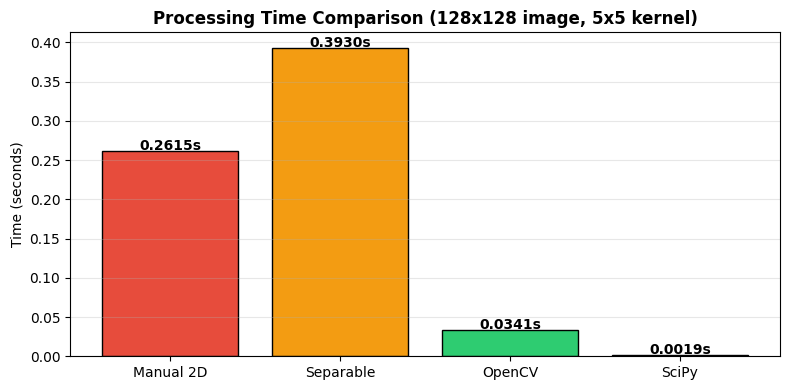

In [1]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt
import time
from scipy import ndimage

_images_dir = os.path.join(os.getcwd(), 'images', 'original')
original = cv2.imread(os.path.join(_images_dir, 'lena.jpg'), cv2.IMREAD_GRAYSCALE)

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

def generate_gaussian_kernel(size, sigma):
    k = size // 2
    ax = np.arange(-k, k + 1, dtype=np.float64)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    kernel /= kernel.sum()
    return kernel

def gaussian_filter_manual(image, kernel_size=3, sigma=1.0):
    kernel = generate_gaussian_kernel(kernel_size, sigma)
    height, width = image.shape
    pad = kernel_size // 2
    padded = np.pad(image.astype(np.float64), pad, mode='reflect')
    filtered = np.zeros_like(image, dtype=np.float64)
    for i in range(height):
        for j in range(width):
            window = padded[i:i + kernel_size, j:j + kernel_size]
            filtered[i, j] = np.sum(window * kernel)
    return np.clip(filtered, 0, 255).astype(np.uint8)

def gaussian_filter_separable(image, kernel_size=3, sigma=1.0):
    k = kernel_size // 2
    ax = np.arange(-k, k + 1, dtype=np.float64)
    kernel_1d = np.exp(-ax ** 2 / (2 * sigma ** 2))
    kernel_1d /= kernel_1d.sum()
    height, width = image.shape
    img = image.astype(np.float64)
    pad_h = np.pad(img, ((0, 0), (k, k)), mode='reflect')
    intermediate = np.zeros_like(img)
    for i in range(height):
        for j in range(width):
            intermediate[i, j] = np.sum(pad_h[i, j:j + kernel_size] * kernel_1d)
    pad_v = np.pad(intermediate, ((k, k), (0, 0)), mode='reflect')
    filtered = np.zeros_like(img)
    for i in range(height):
        for j in range(width):
            filtered[i, j] = np.sum(pad_v[i:i + kernel_size, j] * kernel_1d)
    return np.clip(filtered, 0, 255).astype(np.uint8)

crop = original[:128, :128]
noisy_crop = add_gnoise(crop, 25)
ks_test, sig_test = 5, 1.0

start = time.time()
filtered_manual = gaussian_filter_manual(noisy_crop, ks_test, sig_test)
t_manual = time.time() - start

start = time.time()
filtered_separable = gaussian_filter_separable(noisy_crop, ks_test, sig_test)
t_separable = time.time() - start

start = time.time()
filtered_opencv = cv2.GaussianBlur(noisy_crop, (ks_test, ks_test), sig_test)
t_opencv = time.time() - start

start = time.time()
filtered_scipy = ndimage.gaussian_filter(noisy_crop.astype(np.float64), sigma=sig_test)
t_scipy = time.time() - start

times = {'Manual 2D': t_manual, 'Separable': t_separable, 'OpenCV': t_opencv, 'SciPy': t_scipy}

fig, ax = plt.subplots(figsize=(8, 4))
colors = ['#e74c3c', '#f39c12', '#2ecc71', '#3498db']
bars = ax.bar(times.keys(), times.values(), color=colors, edgecolor='black')
for bar, t in zip(bars, times.values()):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.001,
            f'{t:.4f}s', ha='center', fontweight='bold')
ax.set_ylabel('Time (seconds)')
ax.set_title(f'Processing Time Comparison ({crop.shape[0]}x{crop.shape[1]} image, {ks_test}x{ks_test} kernel)', fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout(); plt.show()


![Processing-time](processing-time.png)

## 3.12 Original vs Gaussian Noise at Different Levels — Code

```python
# Display original image vs noisy versions at different sigma values
noise_levels = [10, 25, 50]

fig, axes = plt.subplots(1, len(noise_levels) + 1, figsize=(4 * (len(noise_levels) + 1), 4))

axes[0].imshow(original, cmap='gray')
axes[0].set_title('Original (Clean)')
axes[0].axis('off')

for idx, nl in enumerate(noise_levels, 1):
    noisy = add_gaussian_noise(original, sigma=nl)
    axes[idx].imshow(noisy, cmap='gray')
    axes[idx].set_title(f'Noisy (sigma={nl})')
    axes[idx].axis('off')

plt.suptitle('Original vs Gaussian Noise at Different Levels', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
```


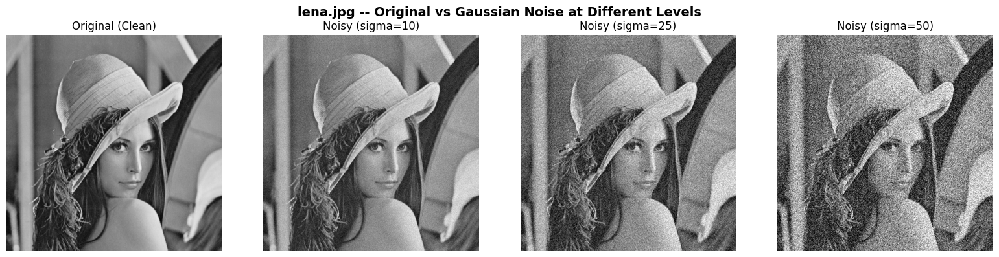

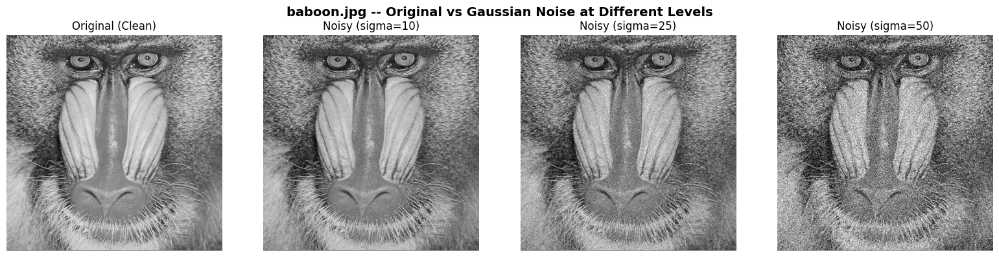

In [2]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt

_images_dir = os.path.join(os.getcwd(), 'images', 'original')

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

for img_name in ['lena.jpg', 'baboon.jpg']:
    original = cv2.imread(os.path.join(_images_dir, img_name), cv2.IMREAD_GRAYSCALE)
    if original is None:
        continue
    noise_levels = [10, 25, 50]
    fig, axes = plt.subplots(1, len(noise_levels) + 1, figsize=(4 * (len(noise_levels) + 1), 4))
    axes[0].imshow(original, cmap='gray'); axes[0].set_title('Original (Clean)'); axes[0].axis('off')
    for idx, nl in enumerate(noise_levels, 1):
        noisy = add_gnoise(original, nl)
        axes[idx].imshow(noisy, cmap='gray'); axes[idx].set_title(f'Noisy (sigma={nl})'); axes[idx].axis('off')
    plt.suptitle(f'{img_name} -- Original vs Gaussian Noise at Different Levels', fontsize=14, fontweight='bold')
    plt.tight_layout(); plt.show()


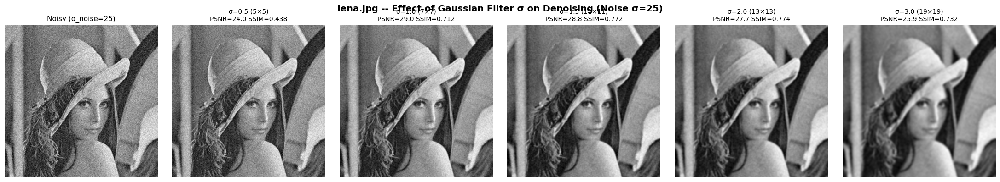

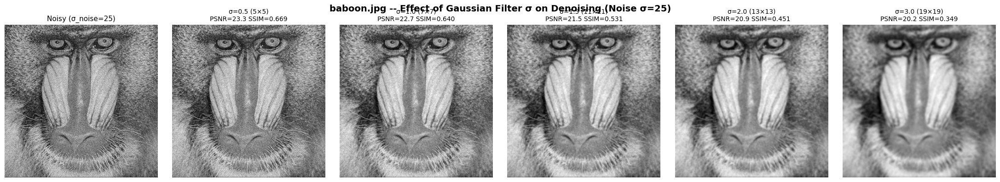

In [1]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

_images_dir = os.path.join(os.getcwd(), 'images', 'original')

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

sigma_values = [0.5, 1.0, 1.5, 2.0, 3.0]

# Process both lena.jpg and baboon.jpg so both images appear in the output
for img_name in ['lena.jpg', 'baboon.jpg']:
    original = cv2.imread(os.path.join(_images_dir, img_name), cv2.IMREAD_GRAYSCALE)
    if original is None:
        continue
    noisy = add_gnoise(original, 25)
    fig, axes = plt.subplots(1, len(sigma_values) + 1, figsize=(22, 4))
    axes[0].imshow(noisy, cmap='gray'); axes[0].set_title('Noisy (σ_noise=25)', fontsize=11); axes[0].axis('off')

    for idx, sig in enumerate(sigma_values, 1):
        ks = 2 * int(np.ceil(3 * sig)) + 1
        filtered = cv2.GaussianBlur(noisy, (ks, ks), sig)
        p = psnr(original, filtered, data_range=255)
        s = ssim(original, filtered, data_range=255)
        axes[idx].imshow(filtered, cmap='gray')
        axes[idx].set_title(f'σ={sig} ({ks}×{ks})\nPSNR={p:.1f} SSIM={s:.3f}', fontsize=10)
        axes[idx].axis('off')

    plt.suptitle(f'{img_name} -- Effect of Gaussian Filter σ on Denoising (Noise σ=25)', fontsize=14, fontweight='bold')
    plt.tight_layout(); plt.show()


![Gaussian-filter](gaussian-filter.png)
![Gaussian-filter](gaussion-filter-baboon.png)

# Section 4
## Median Filter — Theory & Implementation


## 4.1 What is a Median Filter?

A **non-linear** digital filtering technique that replaces each pixel with the **median** of its neighborhood.

$$g(x,y) = \text{median}\{f(x-i, y-j) : (i,j) \in W\}$$

### How It Works (3×3 Window)

$$\begin{bmatrix} 45 & 67 & 89 \\ 23 & \mathbf{50} & 78 \\ 12 & 56 & 91 \end{bmatrix}$$

1. Extract: [45, 67, 89, 23, 50, 78, 12, 56, 91]
2. Sort: [12, 23, 45, **56**, 67, 78, 89, 91]
3. Median = **56** → replaces center pixel (50)


## 4.5 Key Properties

| Property | Advantage |
|----------|-----------|
| **Non-linearity** | Preserves edges, removes outliers |
| **Edge Preservation** | Maintains sharp transitions in intensity |
| **Impulse Noise Removal** | Excellent at salt-and-pepper noise |
| **No Mean Shift** | Robust to extreme values |

### Adaptive Median Filter
- Starts with small kernel (3×3)
- Checks if median is an impulse
- **Dynamically increases** window size if needed
- Preserves non-noisy pixels


## 4.7 Implementation — Manual Median Filter

```python
class MedianFilterImplementation:
    """
    Comprehensive median filter implementation class.
    Includes manual, optimized, and adaptive versions.
    """

    @staticmethod
    def median_filter_manual(image, kernel_size=3):
        """
        Manual implementation of median filter from scratch.

        Args:
            image:       Input grayscale image (2D numpy array)
            kernel_size: Size of square window (odd number)
        Returns:
            Filtered image
        """
        if kernel_size % 2 == 0:
            raise ValueError("Kernel size must be odd")

        height, width = image.shape
        pad = kernel_size // 2

        # Pad the image (reflect mode handles edges better)
        padded_img = np.pad(image, pad, mode='reflect')

        # Initialize output array
        filtered_image = np.zeros_like(image)

        # Slide window across every pixel
        for i in range(height):
            for j in range(width):
                # Extract neighborhood window
                window = padded_img[i:i+kernel_size, j:j+kernel_size]

                # Flatten and sort, then find median
                window_flat = window.flatten()
                window_sorted = np.sort(window_flat)

                # Calculate median index
                median_idx = len(window_sorted) // 2
                median_value = window_sorted[median_idx]

                # Replace pixel with median
                filtered_image[i, j] = median_value

        return filtered_image.astype(np.uint8)

    # Library wrappers
    @staticmethod
    def median_filter_opencv(image, kernel_size=3):
        return cv2.medianBlur(image, kernel_size)

    @staticmethod
    def median_filter_scipy(image, kernel_size=3):
        return ndimage.median_filter(image, size=kernel_size)
```


## 4.7 Implementation — Adaptive Median Filter

```python
    @staticmethod
    def adaptive_median_filter(image, max_kernel_size=7):
        """
        Adaptive median filter that adjusts kernel size based on
        noise detection.

        This filter:
        1. Starts with small kernel (3×3)
        2. Checks if median is an impulse
        3. Increases window size if needed
        4. Preserves non-noisy pixels
        """
        result = np.zeros_like(image)
        height, width = image.shape
        pad_max = max_kernel_size // 2

        padded = np.pad(image, pad_max, mode='reflect')

        for i in range(height):
            for j in range(width):
                kernel_size = 3
                while kernel_size <= max_kernel_size:
                    half = kernel_size // 2

                    # Extract window at current kernel size
                    window = padded[
                        i + pad_max - half : i + pad_max + half + 1,
                        j + pad_max - half : j + pad_max + half + 1
                    ]

                    # Calculate statistics
                    z_min = np.min(window)
                    z_max = np.max(window)
                    z_med = np.median(window)
                    z_xy  = image[i, j]

                    # Level A: Check if median is impulse noise
                    A1 = z_med - z_min
                    A2 = z_med - z_max

                    if A1 > 0 and A2 < 0:
                        # Median is NOT impulse noise
                        # Level B: Check if current pixel is impulse
                        B1 = z_xy - z_min
                        B2 = z_xy - z_max

                        if B1 > 0 and B2 < 0:
                            result[i, j] = z_xy   # Keep original
                        else:
                            result[i, j] = z_med   # Replace with median
                        break
                    else:
                        kernel_size += 2  # Increase window size

                # If max size reached, use median anyway
                if kernel_size > max_kernel_size:
                    result[i, j] = z_med

        return result.astype(np.uint8)
```


## 4.8 Median Filter Demonstration — Code

```python
# Load test image
camera = cv2.imread('images/original/lena.jpg', cv2.IMREAD_GRAYSCALE)

# Add different noise types for comparison
camera_gaussian = add_gaussian_noise(camera, sigma=30)
camera_sp = (random_noise(camera / 255.0, mode='s&p', amount=0.1) * 255
            ).astype(np.uint8)

# Apply median filters with different kernel sizes
kernel_sizes = [3, 5, 7]

fig, axes = plt.subplots(2, len(kernel_sizes) + 2, figsize=(20, 8))

for row, (noisy, label) in enumerate([
    (camera_gaussian, 'Gaussian σ=30'),
    (camera_sp, 'Salt & Pepper 10%')
]):
    axes[row, 0].imshow(camera, cmap='gray')
    axes[row, 0].set_title('Original')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(noisy, cmap='gray')
    axes[row, 1].set_title(f'Noisy\n({label})')
    axes[row, 1].axis('off')

    for i, k in enumerate(kernel_sizes):
        filtered = cv2.medianBlur(noisy, k)
        axes[row, i+2].imshow(filtered, cmap='gray')
        axes[row, i+2].set_title(f'Median {k}×{k}')
        axes[row, i+2].axis('off')

plt.suptitle('Median Filter on Different Noise Types')
plt.tight_layout()
plt.show()
```


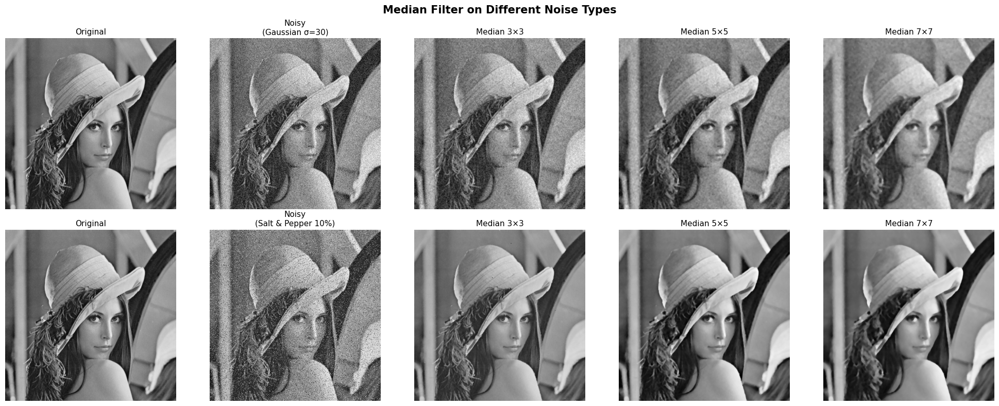

In [1]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt
from skimage import util

_images_dir = os.path.join(os.getcwd(), 'images', 'original')
camera = cv2.imread(os.path.join(_images_dir, 'lena.jpg'), cv2.IMREAD_GRAYSCALE)

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

camera_gaussian = add_gnoise(camera, sigma=30)
camera_sp = (util.random_noise(camera/255.0, mode='s&p', amount=0.1) * 255).astype(np.uint8)

kernel_sizes = [3, 5, 7]

fig, axes = plt.subplots(2, len(kernel_sizes) + 2, figsize=(20, 8))
for row, (noisy, label) in enumerate([(camera_gaussian, 'Gaussian σ=30'), (camera_sp, 'Salt & Pepper 10%')]):
    axes[row, 0].imshow(camera, cmap='gray'); axes[row, 0].set_title('Original', fontsize=11); axes[row, 0].axis('off')
    axes[row, 1].imshow(noisy, cmap='gray'); axes[row, 1].set_title(f'Noisy\n({label})', fontsize=11); axes[row, 1].axis('off')
    for i, k in enumerate(kernel_sizes):
        filtered = cv2.medianBlur(noisy, k)
        axes[row, i+2].imshow(filtered, cmap='gray')
        axes[row, i+2].set_title(f'Median {k}×{k}', fontsize=11)
        axes[row, i+2].axis('off')

plt.suptitle('Median Filter on Different Noise Types', fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()


![median-filter](median-filter.png)

# Section 5
## Comparative Analysis — Median vs Gaussian Filter


## 5.2 Theoretical Comparison

| **Aspect** | **Median Filter** | **Gaussian Filter** |
|------------|-------------------|---------------------|
| **Type** | Non-linear | Linear |
| **Operation** | Order statistics (sorting) | Convolution (weighted average) |
| **Math Basis** | Median of distribution | Gaussian distribution |
| **Best For** | Any noise (robust to outliers) | Gaussian noise (optimal) |
| **Edge Preservation** | ✅ Excellent | ❌ Poor |
| **Texture Preservation** | ⚠️ Moderate | ❌ Poor |
| **Complexity** | $O(n^2 k^2 \log k)$ | $O(n^2 k^2)$ or $O(n^2 \cdot 2k)$ separable |
| **Frequency Response** | Not defined | Low-pass filter |


## 5.4 Quantitative Comparison — Metrics Code

```python
class FilterComparator:
    """Comprehensive comparison between Median and Gaussian filters."""

    def __init__(self):
        self.results = []

    def calculate_metrics(self, original, filtered, noisy=None):
        """Calculate quantitative quality metrics."""
        metrics = {
            'PSNR': psnr(original, filtered, data_range=255),
            'SSIM': ssim(original, filtered, data_range=255),
            'MSE':  np.mean((original - filtered) ** 2),
            'MAE':  np.mean(np.abs(original - filtered))
        }
        if noisy is not None:
            noise_before = np.std(original - noisy)
            noise_after  = np.std(original - filtered)
            metrics['Noise_Reduction'] = (
                (noise_before - noise_after) / noise_before * 100
            )
        return metrics

    def edge_preservation_score(self, original, filtered):
        """
        Calculate edge preservation score using gradient correlation.
        Higher score means better edge preservation.
        """
        # Calculate gradients using Sobel operator
        grad_x_orig = cv2.Sobel(original, cv2.CV_64F, 1, 0, ksize=3)
        grad_y_orig = cv2.Sobel(original, cv2.CV_64F, 0, 1, ksize=3)
        grad_x_filt = cv2.Sobel(filtered, cv2.CV_64F, 1, 0, ksize=3)
        grad_y_filt = cv2.Sobel(filtered, cv2.CV_64F, 0, 1, ksize=3)

        # Calculate gradient magnitude
        mag_orig = np.sqrt(grad_x_orig**2 + grad_y_orig**2)
        mag_filt = np.sqrt(grad_x_filt**2 + grad_y_filt**2)

        # Calculate correlation coefficient
        correlation = np.corrcoef(
            mag_orig.flatten(), mag_filt.flatten()
        )[0, 1]
        return correlation
```


## 5.4 Quantitative Comparison — Comparison Loop

```python
    def comprehensive_comparison(self, image, noise_levels=[10, 25, 50]):
        """Run comprehensive comparison across different noise levels."""
        
        # Define filter configurations
        self.filters = {
            'Median 3×3':   lambda img: cv2.medianBlur(img, 3),
            'Median 5×5':   lambda img: cv2.medianBlur(img, 5),
            'Gaussian σ=1': lambda img: cv2.GaussianBlur(img, (0, 0), 1),
            'Gaussian σ=2': lambda img: cv2.GaussianBlur(img, (0, 0), 2),
        }

        # Test different noise levels
        for sigma in noise_levels:
            # Generate noisy image
            noisy = add_gaussian_noise(image, sigma=sigma)

            for filter_name, filter_func in self.filters.items():
                # Apply filter
                filtered = filter_func(noisy)

                # Calculate metrics
                metrics = self.calculate_metrics(image, filtered, noisy)
                edge_score = self.edge_preservation_score(image, filtered)

                # Store results
                self.results.append({
                    'Noise_Level': sigma,
                    'Filter': filter_name,
                    'PSNR': metrics['PSNR'],
                    'SSIM': metrics['SSIM'],
                    'MSE':  metrics['MSE'],
                    'MAE':  metrics['MAE'],
                    'Noise_Reduction_%': metrics.get('Noise_Reduction', 0),
                    'Edge_Preservation': edge_score
                })

        return pd.DataFrame(self.results)

# Run the comparison
comparator = FilterComparator()
comparison_df = comparator.comprehensive_comparison(camera)

# Generate plots: PSNR, SSIM, Edge Preservation
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, metric, title in zip(axes,
    ['PSNR', 'SSIM', 'Edge_Preservation'],
    ['PSNR (Higher = Better)', 'SSIM (Higher = Better)', 'Edge Preservation']
):
    for fname in comparator.filters:
        data = comparison_df[comparison_df['Filter'] == fname]
        ax.plot(data['Noise_Level'], data[metric], 'o-',
                label=fname, linewidth=2, markersize=7)
    ax.set_xlabel('Noise σ')
    ax.set_ylabel(metric)
    ax.set_title(title, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)
```


In [ ]:
import cv2, os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

_images_dir = os.path.join(os.getcwd(), 'images', 'original')
camera = cv2.imread(os.path.join(_images_dir, 'lena.jpg'), cv2.IMREAD_GRAYSCALE)

def add_gnoise(image, sigma=25):
    return np.clip(image.astype(np.float64) + np.random.normal(0, sigma, image.shape), 0, 255).astype(np.uint8)

def edge_preservation_score(original, filtered):
    gx_o = cv2.Sobel(original, cv2.CV_64F, 1, 0, ksize=3)
    gy_o = cv2.Sobel(original, cv2.CV_64F, 0, 1, ksize=3)
    gx_f = cv2.Sobel(filtered, cv2.CV_64F, 1, 0, ksize=3)
    gy_f = cv2.Sobel(filtered, cv2.CV_64F, 0, 1, ksize=3)
    mag_o = np.sqrt(gx_o**2 + gy_o**2)
    mag_f = np.sqrt(gx_f**2 + gy_f**2)
    return np.corrcoef(mag_o.flatten(), mag_f.flatten())[0, 1]

filters = {
    'Median 3×3': lambda img: cv2.medianBlur(img, 3),
    'Median 5×5': lambda img: cv2.medianBlur(img, 5),
    'Gaussian σ=1': lambda img: cv2.GaussianBlur(img, (0, 0), 1),
    'Gaussian σ=2': lambda img: cv2.GaussianBlur(img, (0, 0), 2),
}

results = []
for sigma in [10, 25, 50]:
    noisy = add_gnoise(camera, sigma=sigma)
    for fname, ffunc in filters.items():
        filt = ffunc(noisy)
        results.append({
            'Noise σ': sigma, 'Filter': fname,
            'PSNR': psnr(camera, filt, data_range=255),
            'SSIM': ssim(camera, filt, data_range=255),
            'Edge Score': edge_preservation_score(camera, filt)
        })

df = pd.DataFrame(results)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, metric, title in zip(axes, ['PSNR', 'SSIM', 'Edge Score'],
                              ['PSNR (Higher = Better)', 'SSIM (Higher = Better)', 'Edge Preservation']):
    for fname in filters:
        data = df[df['Filter'] == fname]
        ax.plot(data['Noise σ'], data[metric], 'o-', label=fname, linewidth=2, markersize=7)
    ax.set_xlabel('Noise σ', fontsize=12); ax.set_ylabel(metric, fontsize=12)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.legend(fontsize=10); ax.grid(True, alpha=0.3)

plt.suptitle('Median Filter vs Gaussian Filter — Quantitative Comparison', fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()


In [3]:
# Print PSNR summary table
print("\n📊 PSNR Comparison (Higher is better):")
print("-" * 60)
pivot = df.pivot(index='Noise σ', columns='Filter', values='PSNR').round(2)
print(pivot.to_string())

print("\n📊 SSIM Comparison (Higher is better, max=1):")
print("-" * 60)
pivot_ssim = df.pivot(index='Noise σ', columns='Filter', values='SSIM').round(4)
print(pivot_ssim.to_string())

print("\n📊 Edge Preservation Score (Higher is better):")
print("-" * 60)
pivot_edge = df.pivot(index='Noise σ', columns='Filter', values='Edge Score').round(4)
print(pivot_edge.to_string())



📊 PSNR Comparison (Higher is better):
------------------------------------------------------------


NameError: name 'df' is not defined

# Section 6
## Strengths, Limitations & Real-World Applications


## Median Filter — Strengths & Limitations

### ✅ Strengths
- **Edge preservation** — selects actual pixel values, not averages
- **Robust to outliers** — 50% breakdown point
- **No intensity blurring** — preserves sharp transitions
- **Adaptive capability** — can auto-adjust kernel size

### ❌ Limitations
- **Slower** — sorting is $O(k^2 \log k)$ vs convolution
- **Removes fine textures** — details smaller than kernel are lost
- **Not optimal for Gaussian noise** — suboptimal efficiency
- **Fixed window trade-off** — small = poor denoising, large = loses detail


## When to Use Which Filter?

| Scenario | Recommended | Reason |
|----------|-------------|--------|
| Pure Gaussian noise | **Gaussian** | Mathematically optimal |
| Salt-and-pepper noise | **Median** | 50% breakdown point |
| Medical X-ray / CT | **Median** | Edge preservation critical |
| Real-time video | **Gaussian** | Faster, separable |
| Pre-processing for edge detection | **Median** | Preserves edges |
| Artistic blur effects | **Gaussian** | Smooth, natural blur |
| Document scanning | **Median** | Removes specks, preserves text |


## Real-World Applications

| Domain | Median Filter | Gaussian Filter |
|--------|---------------|-----------------|
| 📱 **Photography** | Hot/dead pixel removal | Portrait blur, HDR |
| 🏥 **Medical Imaging** | MRI/CT denoising | PET smoothing, fMRI |
| 🛰️ **Remote Sensing** | SAR speckle reduction | Atmospheric noise |
| 🏭 **Industrial** | Defect detection | Background subtraction |
| 🔬 **Scientific** | Cosmic ray removal | Electron microscopy |
| 📄 **Documents** | Photocopy noise removal | Binarization preprocessing |


# Section 7
## Methodology Summary


## End-to-End Workflow

```
Load Clean Image → Add Gaussian Noise (σ) → Apply Denoising Filters → Compute Quality Metrics → Compare & Analyse
```

### Pipeline Steps:
1. **Image Acquisition** — Load grayscale images via OpenCV
2. **Noise Simulation** — $I_{noisy} = I_{original} + n$, where $n \sim \mathcal{N}(0, \sigma^2)$
3. **Filtering** — Gaussian ($\sigma_f = 1, 2$) and Median ($3{\times}3$, $5{\times}5$, $7{\times}7$)
4. **Evaluation** — PSNR, SSIM, MSE, MAE, Edge Preservation
5. **Comparison** — Tables and plots across noise levels


## Tools & Libraries

| Library | Purpose |
|---------|---------|
| **Python 3** | Primary programming language |
| **OpenCV** | Image I/O, GaussianBlur, medianBlur, Sobel |
| **NumPy** | Array operations, noise generation |
| **Matplotlib** | Visualization of images and plots |
| **SciPy** | Alternative filter implementations |
| **scikit-image** | PSNR & SSIM metrics |
| **Pandas** | Tabular results presentation |


# Thank You!

### Key Takeaways

- **Gaussian noise** is the most common noise model — additive, zero-mean, variance-controlled
- **Gaussian filter** is optimal for Gaussian noise — linear, separable, mathematically elegant
- **Median filter** excels at impulse noise & edge preservation — non-linear, robust
- **No single filter is universally best** — choose based on noise type & application

---

### DCIT 407 — Group 8
